# Vector Quantization and K-medoids

Let us begin by loading some modules and libraries.

In [1]:
import numpy as np
import matplotlib.pyplot as plt

from PIL import Image
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from sklearn_extra.cluster import KMedoids

## Vector Quantization

The K-means clustering algorithm represents a key tool in the apparently unrelated area of image and signal compression, particularly in **vector quantization** or VQ. In order to see how K-means can help us in compressing an image, let us load a picture with the `Image` module.

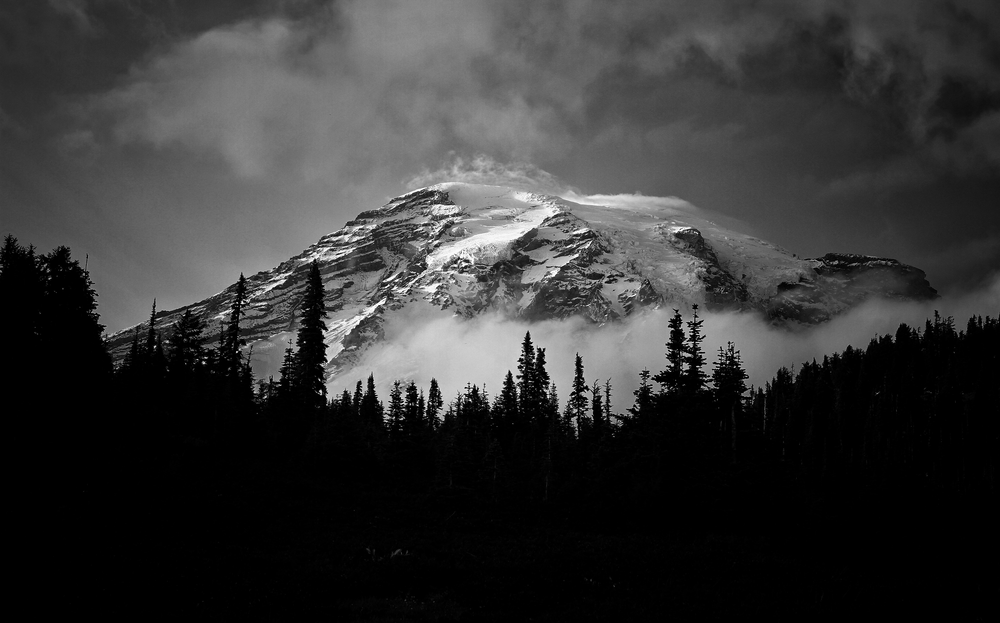

In [2]:
with Image.open('mountain.jpeg') as image:
    image = image.convert('L')

image

The original picture is a color image, which we turn into a black and white image using the method `convert` from the `PIL` library. By the way, the image was taken from https://www.pexels.com/photo/grayscale-photo-of-a-mountain-covered-with-snow-763097/.

To be able to manipulate the information contained in this picture, we need to store this information as a `numpy` array. Let us do that.

In [3]:
image = np.array(image)
image

array([[39, 42, 43, ..., 36, 36, 36],
       [42, 41, 40, ..., 38, 37, 36],
       [42, 40, 38, ..., 37, 35, 33],
       ...,
       [ 0,  0,  0, ...,  0,  0,  0],
       [ 0,  0,  0, ...,  0,  0,  0],
       [ 0,  0,  0, ...,  0,  0,  0]], dtype=uint8)

Notice that each entry of this array is a pixel and its associated intensity value. We, humans, do not distinguish a lot of intensities, so 256 intensity values are enough for us, with zero being black, and 255 the color white. 

So, now that we have a matrix, how are we going to compress the information stored in said matrix? What we will do is to divide the 2D array into chunks of the same size, or same number of pixels if you will, and view each chunk as a vector that lives in a vector space of a certain dimensionality. Then we use the K-means algorithm to find clusters in this data and represent each cluster by its centroid. This means that instead of storing all those data points, we will just have to store the centroids of the clusters that K-means finds, which is, of course, much less information.

Before dividing so that we can conquer, let us check the size of our array.

In [4]:
image.shape

(3230, 5179)

Do you notice something peculiar? If you do not, it is okay, it is not that obvious. It turns out that 5179 is a prime number, which implies that the height of the image can not be divided into chunks os the same length. To solve this tiny issue, we will get rid of the las line of the picture with the following code.

In [5]:
image = image[:, 0:5178]
image.shape

(3230, 5178)

As expected, 5178 is not a prime number, so we are good to go. 

In the following cell we divide the image into non-overlapping blocks of size $n_x\times n_y$. Once we do this, we vectorize each block and consider it as an element of $\mathbb{R}^{n_x\times n_y}$. The result of this process is the data that will be processed by the K-means algorithm.

In [6]:
n_x, n_y = 6, 10
num_splits_x = image.shape[1] // n_x
num_splits_y = image.shape[0] // n_y

split_one = np.array(np.split(image, num_splits_x, axis=1))
split_two = np.array(np.split(split_one, num_splits_y, axis=1))
X = np.reshape(split_two, (num_splits_x * num_splits_y, n_x * n_y))
X

array([[39, 42, 43, ..., 44, 43, 42],
       [40, 41, 42, ..., 43, 42, 41],
       [42, 39, 36, ..., 38, 39, 41],
       ...,
       [ 0,  0,  1, ...,  0,  0,  0],
       [ 0,  0,  0, ...,  0,  0,  0],
       [ 0,  0,  0, ...,  0,  0,  0]], dtype=uint8)

In [13]:
X.shape

(278749, 60)

So the data is basically a collection of vectors that belong to a vector space of sixty dimensions. This is the data that we will feed into the K-means algorithm. In this example, we will work with $K=200$, which implies that each pixel block is approximated by its closest cluster centroid, known as a **codeword**. The clustering process is called the **encoding step**, and the collection of centroids is called the **codebook**.

In [7]:
K = 200

kmeans = KMeans(n_clusters=K).fit(X)

The clustering process can take a while, so be patient. The good news is that we have encoded the image and we have the codebook. Keep in mind that the components of the centroids will be, in general, real values, however, we have to turn them into integers since there is not such a thing as a non-integer intensity in digital images.

In [8]:
codebook = np.array(kmeans.cluster_centers_, dtype='uint8')
codebook

array([[  0,   0,   0, ...,   0,   0,   0],
       [ 78,  64,  50, ..., 118, 123, 120],
       [ 72,  77,  79, ...,  35,  35,  37],
       ...,
       [110, 110, 117, ...,  32,  46,  57],
       [105, 110, 119, ...,  59,  60,  62],
       [ 40,  36,  37, ..., 132, 112, 105]], dtype=uint8)

In [14]:
codebook.shape

(200, 60)

We will also need the labels of each element in our data. The K-means algorithm provides this information as an attribute once we run it over our data.

In [9]:
labels = kmeans.labels_
labels

array([117, 117, 117, ...,   0,   0,   0], dtype=int32)

In [15]:
labels.shape

(278749,)

As it was mentioned before, each pixel block has to be approximated by its centroid. This can be done easily with `labels` and the following line of code.

In [10]:
compression = codebook[labels]
compression

array([[40, 40, 40, ..., 40, 40, 40],
       [40, 40, 40, ..., 40, 40, 40],
       [40, 40, 40, ..., 40, 40, 40],
       ...,
       [ 0,  0,  0, ...,  0,  0,  0],
       [ 0,  0,  0, ...,  0,  0,  0],
       [ 0,  0,  0, ...,  0,  0,  0]], dtype=uint8)

In [16]:
compression.shape

(278749, 60)

The process of constructing the approximate image from the centroids is called the **decoding step**. This step is carried out by the following code.

In [11]:
compressed = np.reshape(compression, (num_splits_y, num_splits_x, n_y, n_x))
compressed_image = np.concatenate((compressed[0, :, :, :]), axis=1)

for i in range(1, num_splits_y):
    temp = np.concatenate((compressed[i, :, :, :]), axis=1)
    compressed_image = np.concatenate((compressed_image, temp), axis=0)

To visualize how the compressed picture looks, we have to convert `compressed_image`, which is a `numpy` array, into a picture that we can see. This can be done by the `fromarray` method from the `Image` module.

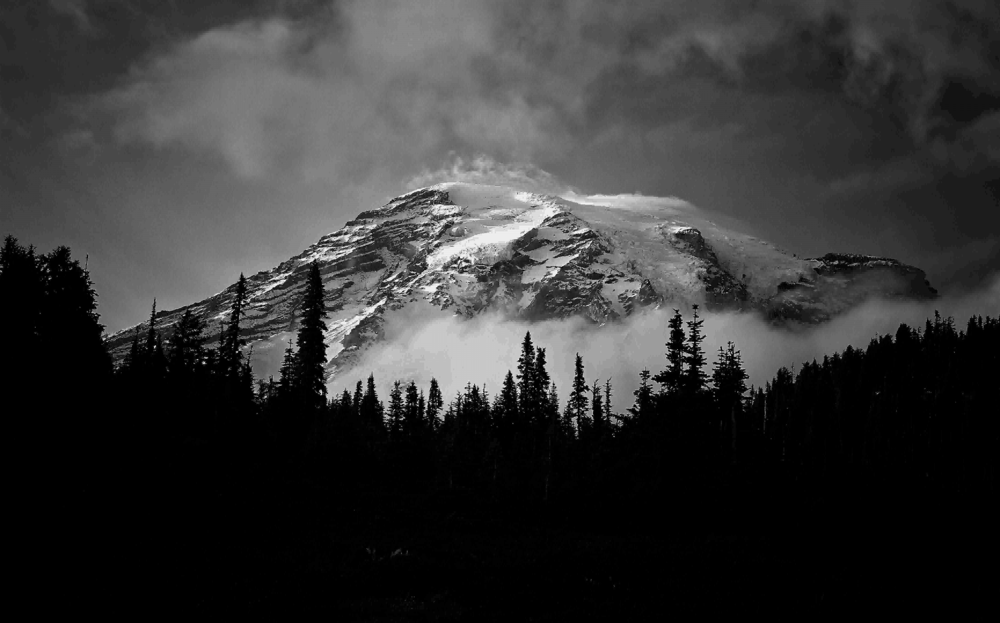

In [12]:
compressed_image = Image.fromarray(compressed_image)
compressed_image

Notice that the quality of the image is not as good as before, which is a natural consequence of the compression process. What we have described is known as **lossy compression**, since our images are degraded versions of the original. 

It is worthwhile to mention that since we need to supply for each block the identity of the codebook entry that approximates it, we will require $\log_2(K)$ bits per block. We also need to supply the codebook itself, which is $K\times60$ in this example, which is not much information. Overall, the storage for the compressed image in this example amounts to 

$$\frac{\log_2(K)}{8n_xn_y}$$

of the original. This is typically expressed as a rate in bits per pixel: 

$$\frac{\log_2(K)}{n_xn_y}.$$

Why do we expect Vector Quantization to work at all? The reason is that for typical everyday images like photographs, many of the blocks look the same. In this case there are many almost pure white blocks, and similarly pure gray blocks of various shades. These require only one block each to represent them, and then multiple pointers to that block.

## K-medoids

As discussed above, the K-means algorithm is appropriate when the dissimilarity measure is taken to be squared Euclidean distance. As expected, this dissimilarity measure forces us to work only with quantitative variables. In addition, using the squared Euclidean distance places the highest influence on the largest distances, which causes the algorithm to lack robustness against outliers. These restrictions can be removed at the expense of computation.

The **K-medoids** algorithm is a variant of the K-means procedure in which we can employ an arbitrary dissimilarity measure. This attribute makes this procedure more robust to noise and outliers. Also, this method finds observations in the data that become the centers, or **medoids**, of the clusters, as opposed to K-means that obtains centroids that are not necessarily part of the given data. 

Given the latter, the K-medoids algorithm is the following:

**initialize** $m_k$, $k=1,2,\dots,K$\
**repeat**\
&emsp;**calculate** $C(i)=\text{argmin}_{1\leq k\leq K}D(x_i,m_k)$\
&emsp;**calculate** $i_k^\star=\text{argmin}_{i:C(i)=k}\sum_{C(\hat{i})}D(x_i,m_k)$, $k=1,2,\dots,K$\
&emsp;**assign** $m_k=x_{i_k^\star}$, $k=1,2,\dots,K$\
**until** the assignments do not change

Notice that this algorithm works with attribute data, but the approach can also be applied to data described only by proximity matrices. Also, there is no need to explicitly compute cluster centers, rather we just keep track of the indices $i_k^\star$. 

By the way, even though K-medoids has some advantages over K-means, it is far more computationally intensive than K-means. Let us see it in action, so we are goint to create some syntetic data with `make_blobs`.

In [17]:
K = 2 
N = 10 
dimension = 2 
X, y = make_blobs(n_samples=N*K, centers=K, n_features=dimension, random_state=3)

Now we visualize these points...

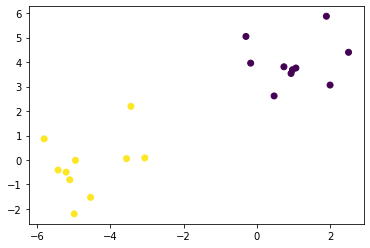

In [18]:
plt.scatter(X[:,0], X[:,1], c=y)
plt.show()

Let us run the K-medoids algorithm. Notice that this is a method from the `sklearn_extra` library.

In [19]:
kmedoids = KMedoids(n_clusters=K, random_state=0).fit(X)

Once the model is trained, we can obtain the labels of our data and the medoids.

In [20]:
y = kmedoids.labels_
medoids = kmedoids.cluster_centers_

Now we can see how K-medoids split the data into two clusters. Notice that the medoids are points that we already have in our data; these are shown as red triangles.

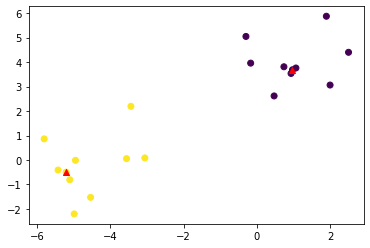

In [21]:
plt.scatter(X[:,0], X[:,1], c=y)
plt.scatter(medoids[:,0], medoids[:,1], marker='^', c='r')
plt.show()

For the sake of comparison, let us run K-means over the same data. By the way, the default dissimilarity measure is the Euclidean distance, but we can change thsi by setting the `metric` parameter as any other pairwise distance.

In [22]:
kmeans = KMeans(n_clusters=K).fit(X)

And we are going to visualize these results, of course.

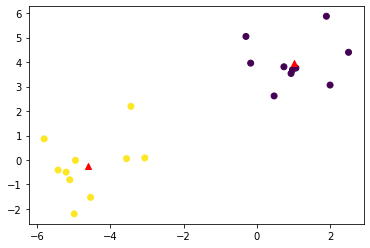

In [23]:
y = kmeans.labels_
centers = kmeans.cluster_centers_

plt.scatter(X[:,0], X[:,1], c=y)
plt.scatter(centers[:,0], centers[:,1], marker='^', c='r')
plt.show()

In this case, both K-means and K-medoids pretty much find the same clusters, however, the centers of the clusters are not the same. As you can see, the centroids are points that, in general, are not contained in our data, something that does not happen with K-medoids.

## References

[1] *Hastie, T., Tibshirani, R., Friedman, J. H., "The elements of statistical learning: data mining, inference, and prediction," New York, Springer, 2009.*

[2] https://scikit-learn-extra.readthedocs.io/en/stable/generated/sklearn_extra.cluster.KMedoids.html